# **Data and libraries**

In [1]:
!pip install albumentations

In [2]:
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import re
import pandas as pd
import random
from tqdm import tqdm
import time
from tqdm.notebook import tqdm, trange
from PIL import Image
from collections import Counter
from sklearn.cluster import KMeans
from skimage import color, filters, io

In [3]:
import torch
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import torchvision.models as models
from torchvision.ops import roi_pool, nms,roi_align
from torchvision.ops import box_iou
from torchvision import ops

In [4]:
PATH = '/kaggle/input/aquarium-data-cots/aquarium_pretrain'
Train_PATH = os.path.join(PATH, 'train')
Test_PATH = os.path.join(PATH, 'test')
Valid_PATH = os.path.join(PATH, 'valid')

train_images_dir = os.path.join(Train_PATH, 'images')
train_labels_dir = os.path.join(Train_PATH, 'labels')

valid_images_dir = os.path.join(Valid_PATH, 'images')
valid_labels_dir = os.path.join(Valid_PATH, 'labels')

test_images_dir = os.path.join(Test_PATH, 'images')
test_labels_dir = os.path.join(Test_PATH, 'labels')

In [5]:
## number of image and labels in each directory
print('----Train____')
print('image: ', len(os.listdir(train_images_dir)))
print('label: ', len(os.listdir(train_labels_dir)))

print('\n----Valid____')
print('image: ', len(os.listdir(valid_images_dir)))
print('label: ', len(os.listdir(valid_labels_dir)))

print('\n----Test____')
print('image: ', len(os.listdir(test_images_dir)))
print('label: ', len(os.listdir(test_labels_dir)))

----Train____
image:  448
label:  448

----Valid____
image:  127
label:  127

----Test____
image:  63
label:  63


In [6]:
def makedataframe(image_dir, label_dir):
    
    image_list = os.listdir(image_dir)
    label_list = os.listdir(label_dir)
    image_list.sort(key = sortkey)
    label_list.sort(key = sortkey)
    
    dic = {'images':[], 'YOLO_format':[], 'Pascal_format':[]}

    for img, label in zip(image_list, label_list):
        
        assert sortkey(img) == sortkey(label), 'image and label are not match'
        
        image_path = os.path.join(image_dir, img)
        dic['images'].append(image_path)
        image = plt.imread(image_path)
        height, width, _ = image.shape
        
        with open(os.path.join(label_dir, label), 'r') as f:
            annotation = f.readlines()
            
        YOLO_list = []
        pascal_list = []
        for annot in annotation:
            label, x, y, w, h = map(float, annot.strip().split())
            YOLO_list.append((x, y, w, h, label))
            
            x1 = int((x - w / 2) * width)
            y1 = int((y - h / 2) * height)
            x2 = int((x + w / 2) * width)
            y2 = int((y + h / 2) * height)
            label = int(label) + 1
            pascal_list.append((x1, y1, x2, y2, label))
            
        dic['Pascal_format'].append(pascal_list)   
        dic['YOLO_format'].append(YOLO_list)
        
    df = pd.DataFrame(dic)
    return df

def sortkey(name):
    match = re.search(r'_(\d+)_', name)
    if match:
        return int(match.group(1))

In [7]:
train_df = makedataframe(train_images_dir, train_labels_dir)
valid_df = makedataframe(valid_images_dir, valid_labels_dir)
test_df = makedataframe(test_images_dir, test_labels_dir)

In [8]:
train_df.head()

,images,YOLO_format,Pascal_format
0,/kaggle/input/aquarium-data-cots/aquarium_pret...,"[(0.2734375, 0.509765625, 0.33984375, 0.146484...","[(79, 447, 340, 597, 1), (577, 591, 767, 720, ..."
1,/kaggle/input/aquarium-data-cots/aquarium_pret...,"[(0.150390625, 0.75927734375, 0.30078125, 0.14...","[(0, 701, 231, 854, 1), (58, 457, 504, 607, 1)..."
2,/kaggle/input/aquarium-data-cots/aquarium_pret...,"[(0.20052083333333334, 0.888671875, 0.23046875...","[(65, 803, 242, 1016, 1), (278, 790, 457, 985,..."
3,/kaggle/input/aquarium-data-cots/aquarium_pret...,"[(0.7903645833333334, 0.0498046875, 0.19661458...","[(531, 0, 682, 102, 1), (303, 636, 474, 729, 1..."
4,/kaggle/input/aquarium-data-cots/aquarium_pret...,"[(0.5989583333333334, 0.482421875, 0.377604166...","[(315, 421, 605, 566, 4)]"


In [9]:
def visualize(df, nrows=5, ncol=5, num=25, fig_size=(10, 5), title=''):
    assert nrows * ncol == num, 'MUST be : nrows*ncol == num'

    classcolor = ['', 'b', 'g', 'r', 'c', 'm', 'y', 'k']
    classes = ['background','fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']

    samples = df.sample(num)
    samples = samples.reset_index()

    fig, ax = plt.subplots(nrows, ncol, figsize=fig_size)
    ax = ax.ravel() 

    for i in trange(num):
        img = plt.imread(samples['images'][i])
        height, width, _ = img.shape

        ax[i].imshow(img)
        ax[i].axis('off')

        for tub in samples['Pascal_format'][i]:
            x1, y1, x2, y2, label = tub
            
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
                                     edgecolor=classcolor[label], facecolor='none')
            ax[i].add_patch(rect)
            ax[i].text(x1, y1-15, classes[label], color=classcolor[label], fontsize=8 ,bbox=dict(facecolor='white', alpha=0.6))
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

  0%|          | 0/25 [00:00<?, ?it/s]

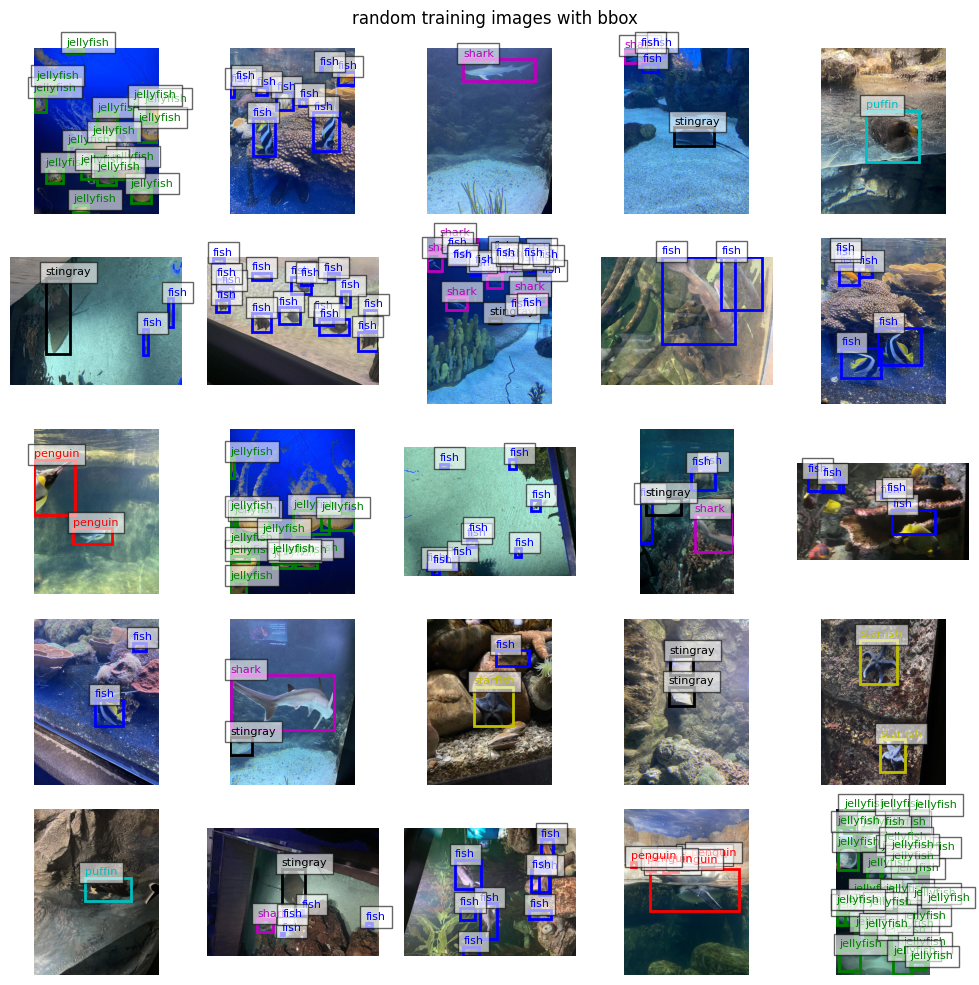

In [10]:
visualize(train_df, nrows=5, ncol=5, num=25, fig_size = (10,10), title = 'random training images with bbox')

# **EDA and Preprocessing**

In [11]:
train_df['images'][1]

'/kaggle/input/aquarium-data-cots/aquarium_pretrain/train/images/IMG_2275_jpeg_jpg.rf.66355520a49ba7fb7082052f7ca6fee0.jpg'

In [12]:
train_df['YOLO_format'][1]

[(0.150390625, 0.75927734375, 0.30078125, 0.1494140625, 0.0),
 (0.3658854166666667, 0.51953125, 0.5807291666666666, 0.146484375, 0.0),
 (0.8776041666666666, 0.0693359375, 0.24348958333333334, 0.1376953125, 0.0),
 (0.8359375, 0.376953125, 0.3268229166666667, 0.12109375, 0.0),
 (0.8541666666666666, 0.4990234375, 0.2890625, 0.1162109375, 0.0),
 (0.08072916666666667, 0.634765625, 0.16145833333333334, 0.111328125, 0.0),
 (0.037109375, 0.04833984375, 0.07421875, 0.0966796875, 0.0),
 (0.7565104166666666, 0.9365234375, 0.4856770833333333, 0.125, 0.0)]

In [13]:
all_labels = train_df['YOLO_format']
object_counts = Counter()
class_distribution = Counter()

for annotations in all_labels:
    object_counts[len(annotations)] += 1  # objects per image
    for annotation in annotations:
        class_distribution[annotation[4]] += 1  

### Number of objects per Image

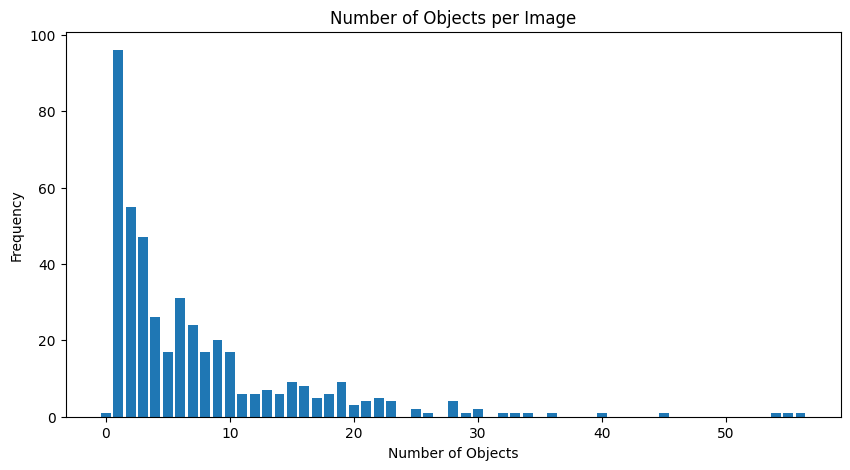

In [14]:
plt.figure(figsize=(10, 5))
plt.bar(object_counts.keys(), object_counts.values())
plt.title('Number of Objects per Image')
plt.xlabel('Number of Objects')
plt.ylabel('Frequency')
plt.show()

### Number of images per class

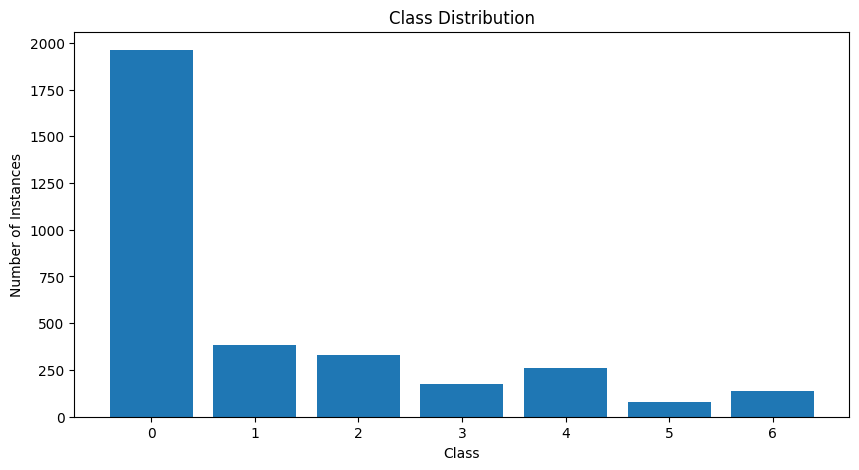

In [15]:
plt.figure(figsize=(10, 5))
plt.bar(class_distribution.keys(), class_distribution.values())
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Instances')
plt.show()

### Height, Width and Acpect ratios

In [16]:
bbox_widths = []
bbox_heights = []
aspect_ratios = []

widths = []
heights = []
aspect_ratios = []

for annotations in all_labels:
    for annot in annotations:
        width = annot[2]  
        height = annot[3]  
        
        bbox_widths.append(width)
        bbox_heights.append(height)
        aspect_ratios.append(width  / height )

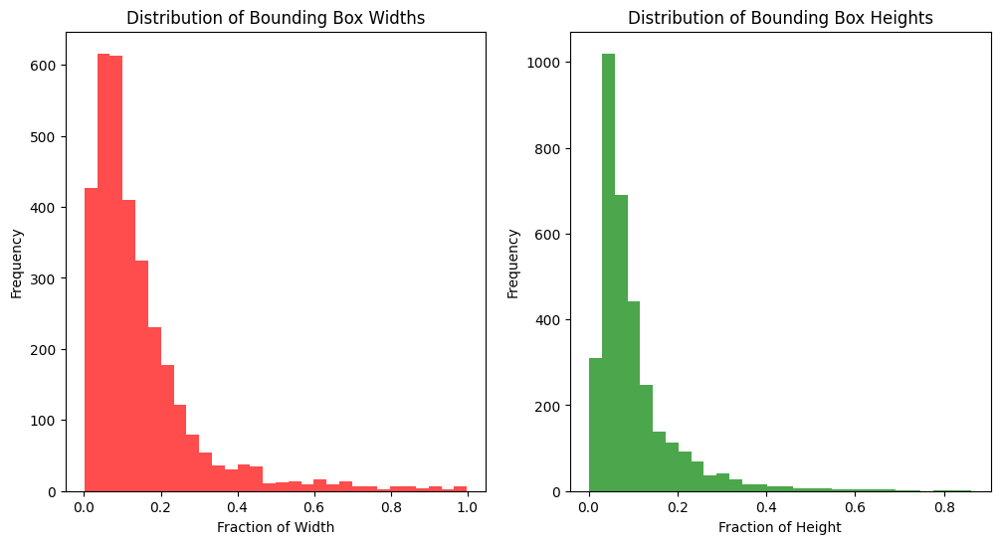

In [17]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(bbox_widths, bins=30, color='red', alpha=0.7)
plt.title('Distribution of Bounding Box Widths')
plt.xlabel('Fraction of Width')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(bbox_heights, bins=30, color='green', alpha=0.7)
plt.title('Distribution of Bounding Box Heights')
plt.xlabel('Fraction of Height')
plt.ylabel('Frequency')
plt.show()

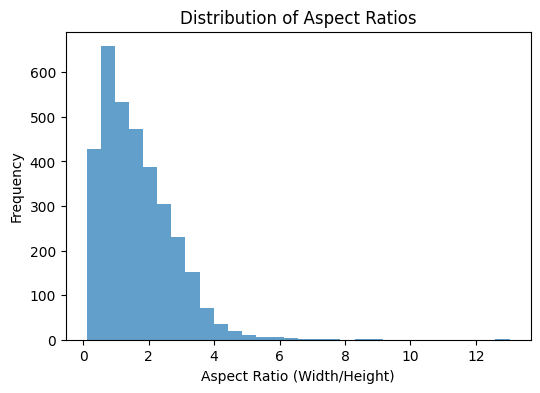

In [18]:
# Aspect ratios
plt.figure(figsize=(6, 4))
plt.hist(aspect_ratios, bins=30, alpha=0.7)
plt.title('Distribution of Aspect Ratios')
plt.xlabel('Aspect Ratio (Width/Height)')
plt.ylabel('Frequency')
plt.show()

In [19]:
"""
bbox_dimensions = np.array([(annot[2], annot[3]) for annots in all_labels for annot in annots])

kmeans = KMeans(n_clusters=9) 
kmeans.fit(bbox_dimensions)

print("Cluster centers (width, height):")
print(kmeans.cluster_centers_)
"""

'\nbbox_dimensions = np.array([(annot[2], annot[3]) for annots in all_labels for annot in annots])\n\nkmeans = KMeans(n_clusters=9) \nkmeans.fit(bbox_dimensions)\n\nprint("Cluster centers (width, height):")\nprint(kmeans.cluster_centers_)\n'

### Sharpness Scores

In [20]:
def calculate_image_sharpness(image_array):
    gray_image = color.rgb2gray(image_array)
    laplacian_var = filters.laplace(gray_image).var()
    return laplacian_var

sharpness_scores = []

for image_path in train_df['images']:
    image_array = io.imread(image_path)
    sharpness = calculate_image_sharpness(image_array)
    sharpness_scores.append(sharpness)

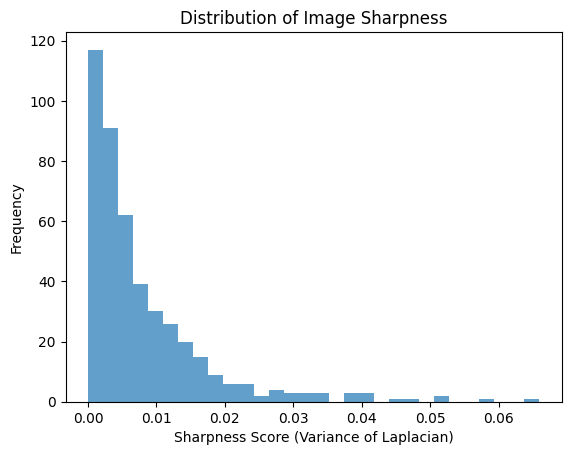

In [21]:
plt.hist(sharpness_scores, bins=30, alpha=0.7)
plt.title('Distribution of Image Sharpness')
plt.xlabel('Sharpness Score (Variance of Laplacian)')
plt.ylabel('Frequency')
plt.show()

### Images Brightness

In [22]:
def calculate_image_brightness(image_path):
    image = io.imread(image_path)
    gray_image = color.rgb2gray(image)
    return np.mean(gray_image)

brightness_mean = train_df['images'].apply(calculate_image_brightness)

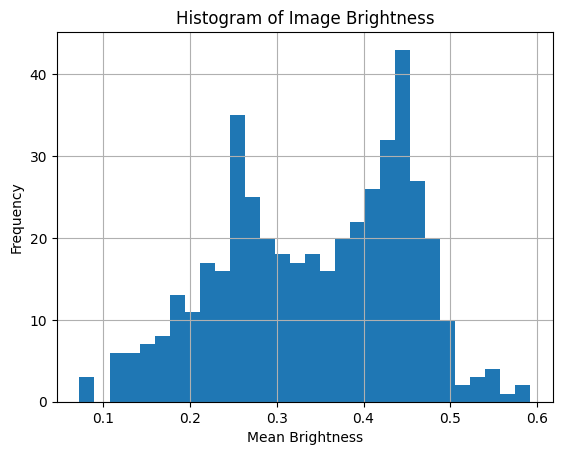

In [23]:
plt.hist(brightness_mean, bins=30)
plt.title('Histogram of Image Brightness')
plt.xlabel('Mean Brightness')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Dataset Preprocessing

In [9]:
#New transforms
train_transforms = A.Compose([
    A.Resize(500, 400),
    A.HorizontalFlip(p=0.5),
    A.RandomCrop(height=500, width=400, p=0.2),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.5),
    A.RGBShift(r_shift_limit=20, g_shift_limit=0, b_shift_limit=-15, p=0.5),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),

], bbox_params=A.BboxParams(format='pascal_voc'))

val_test_transforms = A.Compose([
    A.Resize(500, 400),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
], bbox_params=A.BboxParams(format='pascal_voc'))

## Mosaic Augmentation

In [25]:
class Mosaic:
    def __init__(self, dataframe, mosaic_prob=1):
        self.dataframe = dataframe
        self.mosaic_prob = mosaic_prob

    def __call__(self, image, annotations):
        if random.random() > self.mosaic_prob:
            return image, annotations

        # Select three other images randomly
        indices = np.random.choice(len(self.dataframe), 3, replace=False)
        images = [image]
        annots = [annotations]

        for idx in indices:
            img_path = self.dataframe.iloc[idx, 0]
            img_annots = self.dataframe.iloc[idx, 1]

            if isinstance(img_annots, str):
                img_annots = eval(img_annots)  
            
            img = Image.open(img_path).convert('RGB')
            img = np.array(img)
            images.append(img)
            annots.append(img_annots)

        return self.mosaic(images, annots)

    def mosaic(self, images, annotations):
        # Size of the new image
        final_h, final_w = 1024, 768
        yc, xc = [int(random.uniform(final_h * 0.25, final_h * 0.75)), int(random.uniform(final_w * 0.25, final_w * 0.75))] 
        new_image = np.full((final_h, final_w, 3), 114, dtype=np.uint8)  
        new_annotations = []

        for i, (img, annots) in enumerate(zip(images, annotations)):
            h, w, _ = img.shape
            if i == 0:  # top-left
                x1a, y1a, x2a, y2a = max(xc - w, 0), max(yc - h, 0), xc, yc
                x1b, y1b, x2b, y2b = w - (x2a - x1a), h - (y2a - y1a), w, h
            elif i == 1:  # top-right
                x1a, y1a, x2a, y2a = xc, max(yc - h, 0), min(xc + w, final_w), yc
                x1b, y1b, x2b, y2b = 0, h - (y2a - y1a), min(w, x2a - x1a), h
            elif i == 2:  # bottom-left
                x1a, y1a, x2a, y2a = max(xc - w, 0), yc, xc, min(yc + h, final_h)
                x1b, y1b, x2b, y2b = w - (x2a - x1a), 0, w, min(h, y2a - y1a)
            elif i == 3:  # bottom-right
                x1a, y1a, x2a, y2a = xc, yc, min(xc + w, final_w), min(yc + h, final_h)
                x1b, y1b, x2b, y2b = 0, 0, min(w, x2a - x1a), min(h, y2a - y1a)

            # Ensure the slices have positive dimensions
            if y1a < y2a and x1a < x2a and y1b < y2b and y1b < y2b:
                new_image[y1a:y2a, x1a:x2a] = img[y1b:y2b, x1b:x2b]

                # Adjust annotations
                for annot in annots:
                    x, y, bbox_w, bbox_h, label = annot
                    x_center = x * w
                    y_center = y * h
                    new_x = x_center + x1a - x1b
                    new_y = y_center + y1a - y1b

                    new_x1 = new_x - (bbox_w * w / 2)
                    new_y1 = new_y - (bbox_h * h / 2)
                    new_x2 = new_x + (bbox_w * w / 2)
                    new_y2 = new_y + (bbox_h * h / 2)

                    if new_x1 < x2a and new_x2 > x1a and new_y1 < y2a and new_y2 > y1a:
                        new_w = bbox_w * w / final_w
                        new_h = bbox_h * h / final_h

                        # Clip bbox
                        new_x1 = max(new_x1, x1a)
                        new_y1 = max(new_y1, y1a)
                        new_x2 = min(new_x2, x2a)
                        new_y2 = min(new_y2, y2a)

                        clipped_x = (new_x1 + new_x2) / 2 / final_w
                        clipped_y = (new_y1 + new_y2) / 2 / final_h
                        clipped_w = (new_x2 - new_x1) / final_w
                        clipped_h = (new_y2 - new_y1) / final_h

                        new_annotations.append([
                            clipped_x,
                            clipped_y,
                            clipped_w,
                            clipped_h,
                            label
                        ])

        return new_image, new_annotations

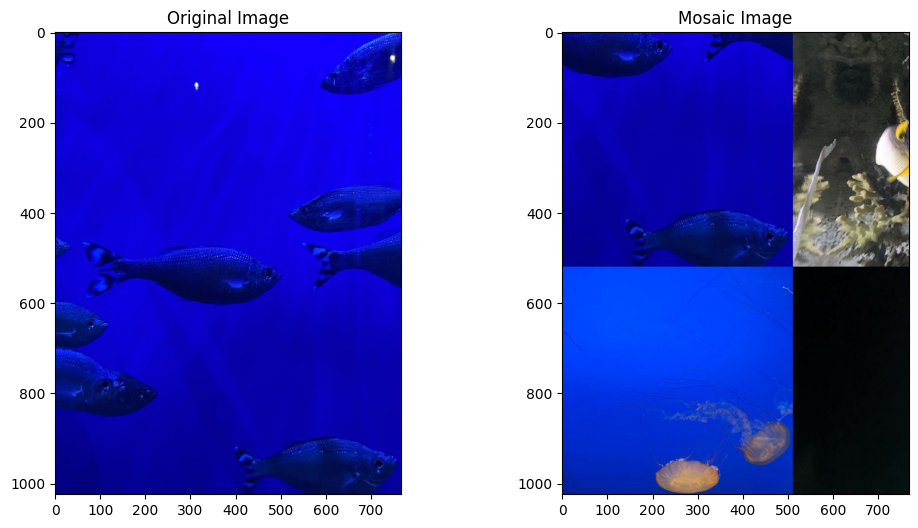

In [26]:
mosaic_transform = Mosaic(train_df, mosaic_prob = 1)  
img_path = train_df.iloc[1, 0]
annotations = train_df.iloc[1, 1]
image = Image.open(img_path).convert('RGB')
image = np.array(image)

mosaic_image, mosaic_annotations = mosaic_transform(image, annotations)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(image)
ax[0].set_title('Original Image')

ax[1].imshow(mosaic_image)
ax[1].set_title('Mosaic Image')

plt.show()

# **Dataset and Data Loader**

In [10]:
class dataset_maker(Dataset):
    
    def __init__(self, dataframe, transform = None, mosaic_transform = None):
        self.dataframe = dataframe
        self.transform = transform
        self.mosaic_transform = mosaic_transform
        
    def __len__(self):
        return len(self.dataframe)
    
    def __getitem__(self, idx):
        
        img_path = self.dataframe.iloc[idx, 0]
        annotations = self.dataframe.iloc[idx, 2]
        
        image = Image.open(img_path).convert('RGB')
        image = np.array(image)
        
        annotations = [list(annotation) for annotation in annotations]

        if self.transform:
            transformed = self.transform(image = image, bboxes = annotations)
            image = transformed['image']
            annotations = transformed['bboxes']
            
        if self.mosaic_transform:
            image, annotations = self.mosaic_transform(image, annotations)            
            
        image = np.array(image).transpose(2,0,1)
        bbox = np.array([annot[:4] for annot in annotations])
        cls_labels = np.array([annot[4] for annot in annotations])
                    
        return image, annotations, cls_labels

In [11]:
def collatefn(batch):
    images, annotations, cls_labels = zip(*batch)
    
    images = [torch.tensor(image) if not isinstance(image, torch.Tensor) else image for image in images]

    annotations_tensor = [torch.tensor(annotation, dtype=torch.float32) if len(annotation) > 0 else torch.zeros((1, 4), dtype=torch.float32) for annotation in annotations]
    cls_label_tensor = [torch.tensor(clas, dtype=torch.long) if len(clas) > 0 else torch.zeros((1,), dtype=torch.long) for clas in cls_labels]
    
    max_len = max(annotation.size(0) for annotation in annotations_tensor)
    max_dim = max(annotation.size(1) for annotation in annotations_tensor if annotation.ndimension() > 1)
    annotations_tensor = [F.pad(annotation, (0, max_dim - annotation.size(1), 0, max_len - annotation.size(0)), value=-1) if annotation.size(0) < max_len or annotation.size(1) < max_dim else annotation for annotation in annotations_tensor]

    max_len_cls = max(cls.size(0) for cls in cls_label_tensor)
    cls_label_tensor = [F.pad(cls, (0, max_len_cls - cls.size(0)), value=-1) if cls.size(0) < max_len_cls else cls for cls in cls_label_tensor]
    
    images = torch.stack(images)
    padded_annotations = torch.stack(annotations_tensor)
    padded_cls_label_tensor = torch.stack(cls_label_tensor)
    
    return images, padded_annotations, padded_cls_label_tensor

In [12]:
train_dataset = dataset_maker(train_df, transform = train_transforms)
valid_dataset = dataset_maker(valid_df, transform = val_test_transforms)
test_dataset = dataset_maker(test_df, transform = val_test_transforms)


train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn= collatefn)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False, collate_fn=collatefn)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=collatefn)

In [13]:
def visualize_dataloader(data_loader, nrows=4, ncol=4, num = BATCH_SIZE, fig_size=(10, 5), title=''):
    
    assert nrows * ncol == num, 'MUST be : nrows*ncol == num'
    for image, annot, cls_label in data_loader:
        break
    classcolor = ['', 'b', 'g', 'r', 'c', 'm', 'y', 'k']
    classes = ['background', 'fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']


    fig, ax = plt.subplots(nrows, ncol, figsize=fig_size)
    ax = ax.ravel() 

    for i in trange(num):
        img = image[i].permute(1,2,0)
        img = (img * 0.5) + 0.5
        height, width, _ = img.shape
        
        ax[i].imshow(img)
        ax[i].axis('off')
        
        valid_row_indices = (annot[i] != -1).any(dim=1).nonzero(as_tuple=False).squeeze()
        valid_values = annot[i][valid_row_indices]
        
        if len(valid_values.shape) == 1:
            valid_values = valid_values.unsqueeze(0)
        
        for value in valid_values:
            
            x1, y1, x2, y2, label = value
            label = int(label)
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=3,
                                     edgecolor=classcolor[label], facecolor='none')
            ax[i].add_patch(rect)
            ax[i].text(x1, y1-15, classes[label], color=classcolor[label], fontsize=10, bbox=dict(facecolor='white', alpha=0.6))
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

  0%|          | 0/16 [00:00<?, ?it/s]

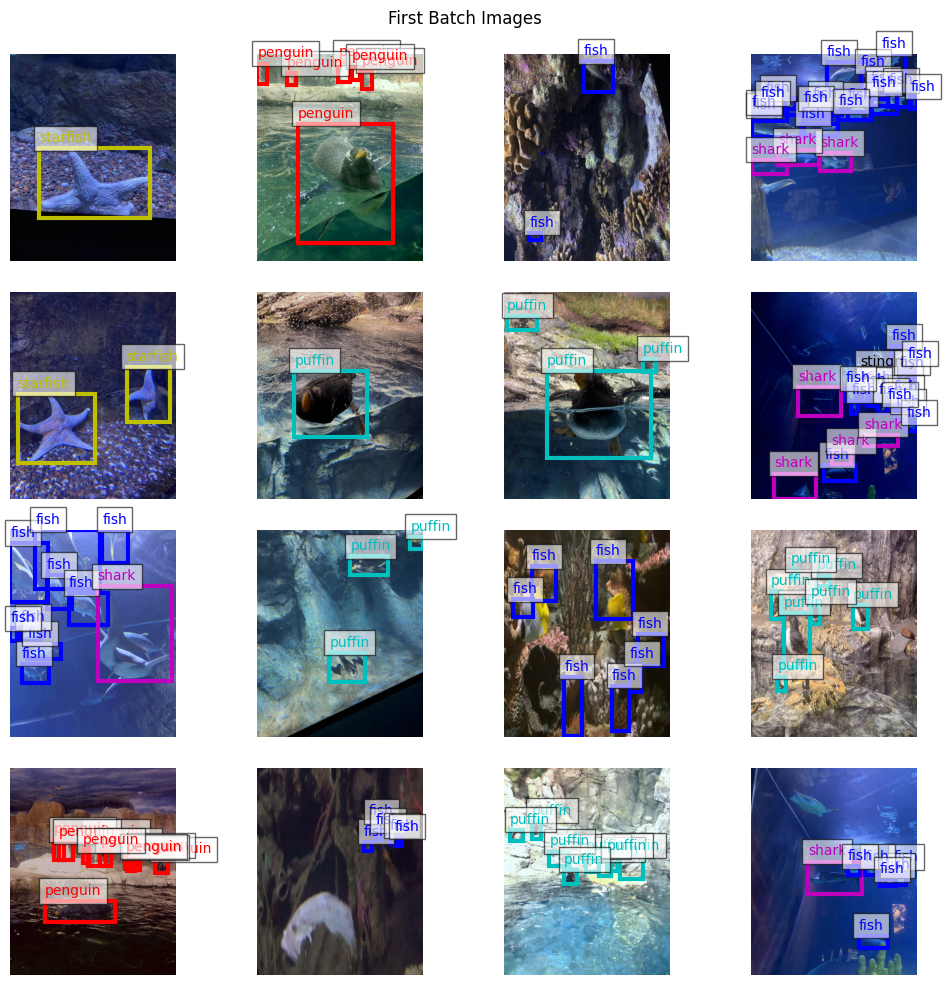

In [14]:
visualize_dataloader(train_loader, nrows=4, ncol=4, num = 16, fig_size=(10, 10), title='First Batch Images')

  0%|          | 0/16 [00:00<?, ?it/s]

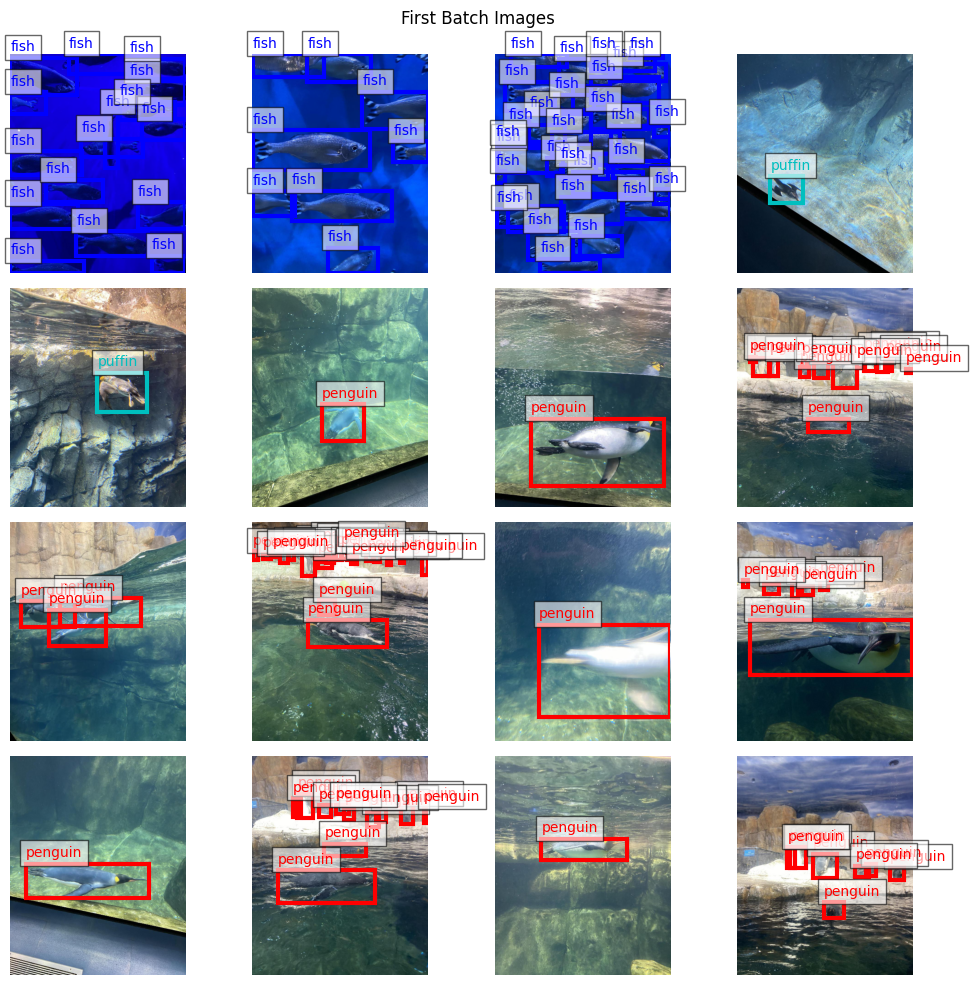

In [15]:
visualize_dataloader(valid_loader, nrows=4, ncol=4, num = 16, fig_size=(10, 10), title='First Batch Images')

# **Utils**

In [16]:
import torch
from torchvision import ops

def calc_gt_offsets(pos_anc_coords, gt_bbox_mapping):
    pos_anc_coords = ops.box_convert(pos_anc_coords, in_fmt='xyxy', out_fmt='cxcywh')
    gt_bbox_mapping = ops.box_convert(gt_bbox_mapping, in_fmt='xyxy', out_fmt='cxcywh')

    gt_cx, gt_cy, gt_w, gt_h = gt_bbox_mapping[:, 0], gt_bbox_mapping[:, 1], gt_bbox_mapping[:, 2], gt_bbox_mapping[:, 3]
    anc_cx, anc_cy, anc_w, anc_h = pos_anc_coords[:, 0], pos_anc_coords[:, 1], pos_anc_coords[:, 2], pos_anc_coords[:, 3]

    tx_ = (gt_cx - anc_cx) / anc_w
    ty_ = (gt_cy - anc_cy) / anc_h
    tw_ = torch.log(gt_w / anc_w)
    th_ = torch.log(gt_h / anc_h)

    return torch.stack([tx_, ty_, tw_, th_], dim=-1)

def gen_anc_centers(out_size):
    out_h, out_w = out_size

    anc_pts_x = torch.arange(0, out_w) + 0.5
    anc_pts_y = torch.arange(0, out_h) + 0.5

    return anc_pts_x, anc_pts_y

def project_bboxes(bboxes, width_scale_factor, height_scale_factor, mode='a2p'):
    assert mode in ['a2p', 'p2a']

    batch_size = bboxes.size(dim=0)
    proj_bboxes = bboxes.clone().reshape(batch_size, -1, 4)
    invalid_bbox_mask = (proj_bboxes == -1)  # indicating padded bboxes

    if mode == 'a2p':
        # activation map to pixel image
        proj_bboxes[:, :, [0, 2]] *= width_scale_factor
        proj_bboxes[:, :, [1, 3]] *= height_scale_factor
    else:
        # pixel image to activation map
        proj_bboxes[:, :, [0, 2]] /= width_scale_factor
        proj_bboxes[:, :, [1, 3]] /= height_scale_factor

    proj_bboxes.masked_fill_(invalid_bbox_mask, -1)  # fill padded bboxes back with -1
    proj_bboxes.resize_as_(bboxes)

    return proj_bboxes

def generate_proposals(anchors, offsets):
    # change format of the anchor boxes from 'xyxy' to 'cxcywh'
    anchors = ops.box_convert(anchors, in_fmt='xyxy', out_fmt='cxcywh')

    # apply offsets to anchors to create proposals
    proposals_ = torch.zeros_like(anchors)
    proposals_[:, 0] = anchors[:, 0] + offsets[:, 0] * anchors[:, 2]
    proposals_[:, 1] = anchors[:, 1] + offsets[:, 1] * anchors[:, 3]
    proposals_[:, 2] = anchors[:, 2] * torch.exp(offsets[:, 2])
    proposals_[:, 3] = anchors[:, 3] * torch.exp(offsets[:, 3])

    # change format of proposals back from 'cxcywh' to 'xyxy'
    proposals = ops.box_convert(proposals_, in_fmt='cxcywh', out_fmt='xyxy')

    return proposals

def gen_anc_base(anc_pts_x, anc_pts_y, anc_scales, anc_ratios, out_size):
    n_anc_boxes = len(anc_scales) * len(anc_ratios)
    anc_base = torch.zeros(1, anc_pts_y.size(dim=0), anc_pts_x.size(dim=0), n_anc_boxes, 4)  # shape - [1, Hmap, Wmap, n_anchor_boxes, 4]

    for ix, xc in enumerate(anc_pts_x):
        for jx, yc in enumerate(anc_pts_y):
            anc_boxes = torch.zeros((n_anc_boxes, 4))
            c = 0
            for i, scale in enumerate(anc_scales):
                for j, ratio in enumerate(anc_ratios):
                    w = scale * ratio
                    h = scale

                    xmin = xc - w / 2
                    ymin = yc - h / 2
                    xmax = xc + w / 2
                    ymax = yc + h / 2

                    anc_boxes[c, :] = torch.Tensor([xmin, ymin, xmax, ymax])
                    c += 1

            anc_base[:, jx, ix, :] = ops.clip_boxes_to_image(anc_boxes, size=out_size)

    return anc_base

def get_iou_mat(batch_size, anc_boxes_all, gt_bboxes_all):

    # flatten anchor boxes
    anc_boxes_flat = anc_boxes_all.reshape(batch_size, -1, 4)
    # get total anchor boxes for a single image
    tot_anc_boxes = anc_boxes_flat.size(dim=1)

    # create a placeholder to compute IoUs amongst the boxes
    ious_mat = torch.zeros((batch_size, tot_anc_boxes, gt_bboxes_all.size(dim=1)))

    # compute IoU of the anc boxes with the gt boxes for all the images
    for i in range(batch_size):
        gt_bboxes = gt_bboxes_all[i]
        anc_boxes = anc_boxes_flat[i]
        # ious_mat[i, :] = ops.box_iou(anc_boxes, gt_bboxes)
        ious_mat[i, :] = ops.box_iou(anc_boxes, gt_bboxes)


    return ious_mat

def get_req_anchors(anc_boxes_all, gt_bboxes_all, gt_classes_all, pos_thresh=0.7, neg_thresh=0.2):
    device = anc_boxes_all.device
    anc_boxes_all = anc_boxes_all.to(device)
    gt_bboxes_all = gt_bboxes_all.to(device)
    gt_classes_all = gt_classes_all.to(device)

    B, w_amap, h_amap, A, _ = anc_boxes_all.shape
    N = gt_bboxes_all.shape[1]  # max number of groundtruth bboxes in a batch
    tot_anc_boxes = A * w_amap * h_amap

    # Get IoU matrix
    iou_mat = get_iou_mat(B, anc_boxes_all, gt_bboxes_all).to(device)

    max_iou_per_gt_box, _ = iou_mat.max(dim=1, keepdim=True)

    positive_anc_mask = torch.logical_and(iou_mat == max_iou_per_gt_box, max_iou_per_gt_box > 0)
    positive_anc_mask = torch.logical_or(positive_anc_mask, iou_mat > pos_thresh)

    positive_anc_ind_sep = torch.where(positive_anc_mask)[0]
    positive_anc_mask = positive_anc_mask.flatten(start_dim=0, end_dim=1)
    positive_anc_ind = torch.where(positive_anc_mask)[0]

    max_iou_per_anc, max_iou_per_anc_ind = iou_mat.max(dim=-1)
    max_iou_per_anc = max_iou_per_anc.flatten(start_dim=0, end_dim=1)

    GT_conf_scores = max_iou_per_anc[positive_anc_ind]

    gt_classes_expand = gt_classes_all.view(B, 1, N).expand(B, tot_anc_boxes, N).to(device)
    GT_class = torch.gather(gt_classes_expand, -1, max_iou_per_anc_ind.unsqueeze(-1)).squeeze(-1)
    GT_class = GT_class.flatten(start_dim=0, end_dim=1)
    GT_class_pos = GT_class[positive_anc_ind]

    gt_bboxes_expand = gt_bboxes_all.view(B, 1, N, 4).expand(B, tot_anc_boxes, N, 4).to(device)
    GT_bboxes = torch.gather(gt_bboxes_expand, -2, max_iou_per_anc_ind.reshape(B, tot_anc_boxes, 1, 1).repeat(1, 1, 1, 4))
    GT_bboxes = GT_bboxes.flatten(start_dim=0, end_dim=2)
    GT_bboxes_pos = GT_bboxes[positive_anc_ind]

    anc_boxes_flat = anc_boxes_all.flatten(start_dim=0, end_dim=-2)
    positive_anc_coords = anc_boxes_flat[positive_anc_ind]

    GT_offsets = calc_gt_offsets(positive_anc_coords, GT_bboxes_pos)

    negative_anc_mask = (max_iou_per_anc < neg_thresh)
    negative_anc_ind = torch.where(negative_anc_mask)[0]
    negative_anc_ind = negative_anc_ind[torch.randint(0, negative_anc_ind.shape[0], (positive_anc_ind.shape[0],))]
    negative_anc_coords = anc_boxes_flat[negative_anc_ind]

    return positive_anc_ind, negative_anc_ind, GT_conf_scores, GT_offsets, GT_class_pos, \
         positive_anc_coords, negative_anc_coords, positive_anc_ind_sep


# Visualize Functions

In [34]:
def visualize_dataloader(data_loader,x_points, y_points, nrows=4, ncol=4, num = BATCH_SIZE, fig_size=(10, 5), title=''):
    
    assert nrows * ncol == num, 'MUST be : nrows*ncol == num'
    for image, annot, cls_label in data_loader:
        break
    classcolor = ['', 'b', 'g', 'r', 'c', 'm', 'y', 'k']
    classes = ['background', 'fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']


    fig, ax = plt.subplots(nrows, ncol, figsize=fig_size)
    ax = ax.ravel() 

    for i in trange(num):
        img = image[i].permute(1,2,0)
        img = (img * 0.5) + 0.5
        height, width, _ = img.shape
        
        ax[i].imshow(img)
        ax[i].axis('off')
        
        valid_row_indices = (annot[i] != -1).any(dim=1).nonzero(as_tuple=False).squeeze()
        valid_values = annot[i][valid_row_indices]
        
        for x in x_points:
            for y in y_points:
                ax[i].scatter(x, y, color="w", marker='+')
        
        if len(valid_values.shape) == 1:
            valid_values = valid_values.unsqueeze(0)
        
        for value in valid_values:
            
            x1, y1, x2, y2, label = value
            label = int(label)
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=3,
                                     edgecolor=classcolor[label], facecolor='none')
            ax[i].add_patch(rect)
            ax[i].text(x1, y1-15, classes[label], color=classcolor[label], fontsize=10, bbox=dict(facecolor='white', alpha=0.6))
            
        
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

  0%|          | 0/4 [00:00<?, ?it/s]

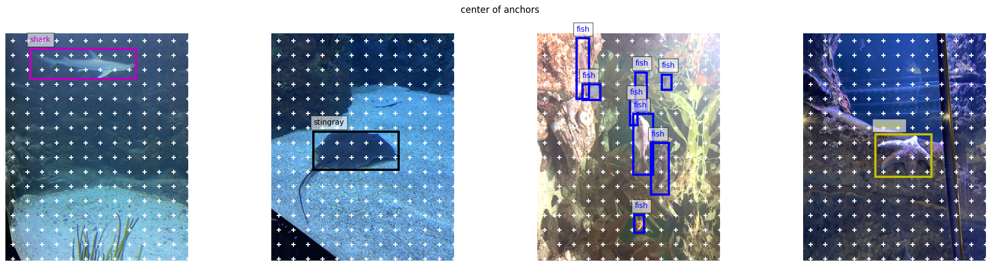

In [35]:
x_points, y_points = gen_anc_centers(out_size = (16, 13))
x_points = x_points * 32
y_points = y_points * 32

visualize_dataloader(train_loader, x_points, y_points, nrows=1, ncol=4, num = 4, fig_size=(20, 5), title='center of anchors')

In [36]:
def visualize_dataloader(data_loader,x_points, y_points, nrows=4, ncol=4, num = BATCH_SIZE, fig_size=(10, 5), title=''):
    
    assert nrows * ncol == num, 'MUST be : nrows*ncol == num'
    for image, annot, cls_label in data_loader:
        break
    classcolor = ['', 'b', 'g', 'r', 'c', 'm', 'y', 'k']
    classes = ['background', 'fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
    
    all_anchors = gen_anc_base(x_points, y_points, anc_scales=[64 ,128, 256], anc_ratios=[0.5, 1, 2], out_size=(500, 400))
    all_anchors = all_anchors.repeat(num,1,1,1,1).reshape(num, -1, 4)
    
    fig, ax = plt.subplots(nrows, ncol, figsize=fig_size)
    ax = ax.ravel() 

    for i in trange(num):
        img = image[i].permute(1,2,0)
        img = (img * 0.5) + 0.5
        height, width, _ = img.shape
        
        ax[i].imshow(img)
        ax[i].axis('off')
        
        valid_row_indices = (annot[i] != -1).any(dim=1).nonzero(as_tuple=False).squeeze()
        valid_values = annot[i][valid_row_indices]
        
        for x in x_points:
            for y in y_points:
                ax[i].scatter(x, y, color="w", marker='+')
                
        for anc in all_anchors:
            for value in anc[504:513]:
                x1, y1, x2, y2 = value
                rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='red', facecolor='none')
                ax[i].add_patch(rect)
            
                
        if len(valid_values.shape) == 1:
            valid_values = valid_values.unsqueeze(0)
        
        for value in valid_values:
            
            x1, y1, x2, y2, label = value
            label = int(label)
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=3,
                                     edgecolor=classcolor[label], facecolor='none')
            ax[i].add_patch(rect)
            ax[i].text(x1, y1-15, classes[label], color=classcolor[label], fontsize=10, bbox=dict(facecolor='white', alpha=0.6))
            
        
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

  0%|          | 0/4 [00:00<?, ?it/s]

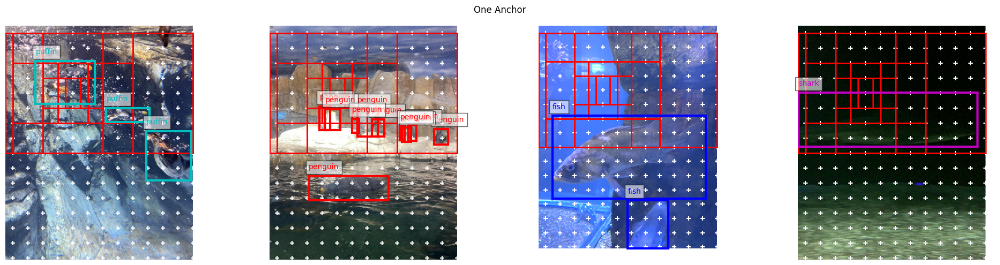

In [37]:
x_points, y_points = gen_anc_centers(out_size = (16, 13))
x_points = x_points * 32
y_points = y_points * 32

visualize_dataloader(train_loader, x_points, y_points, nrows=1, ncol=4, num = 4, fig_size=(20, 5), title='One Anchor')

In [38]:
def visualize_dataloader(data_loader,x_points, y_points, nrows=4, ncol=4, num = BATCH_SIZE, fig_size=(10, 5), title=''):
    
    assert nrows * ncol == num, 'MUST be : nrows*ncol == num'
    for image, annot, cls_label in data_loader:
        break
    classcolor = ['', 'b', 'g', 'r', 'c', 'm', 'y', 'k']
    classes = ['background', 'fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
    
    all_anchors = gen_anc_base(x_points, y_points, anc_scales=[64 ,128, 256], anc_ratios=[0.5, 1, 2], out_size=(500, 400))
    all_anchors = all_anchors.repeat(num,1,1,1,1).reshape(num, -1, 4)
    
    fig, ax = plt.subplots(nrows, ncol, figsize=fig_size)
    ax = ax.ravel() 

    for i in trange(num):
        img = image[i].permute(1,2,0)
        img = (img * 0.5) + 0.5
        height, width, _ = img.shape
        
        ax[i].imshow(img)
        ax[i].axis('off')
        
        valid_row_indices = (annot[i] != -1).any(dim=1).nonzero(as_tuple=False).squeeze()
        valid_values = annot[i][valid_row_indices]
        
        for x in x_points:
            for y in y_points:
                ax[i].scatter(x, y, color="w", marker='+')
                
        for anc in all_anchors:
            for value in anc[::9]:
                x1, y1, x2, y2 = value
                rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='red', facecolor='none')
                ax[i].add_patch(rect)
            
                
        if len(valid_values.shape) == 1:
            valid_values = valid_values.unsqueeze(0)
        
        for value in valid_values:
            
            x1, y1, x2, y2, label = value
            label = int(label)
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=3,
                                     edgecolor=classcolor[label], facecolor='none')
            ax[i].add_patch(rect)
            ax[i].text(x1, y1-15, classes[label], color=classcolor[label], fontsize=10, bbox=dict(facecolor='white', alpha=0.6))
            
        
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


  0%|          | 0/4 [00:00<?, ?it/s]

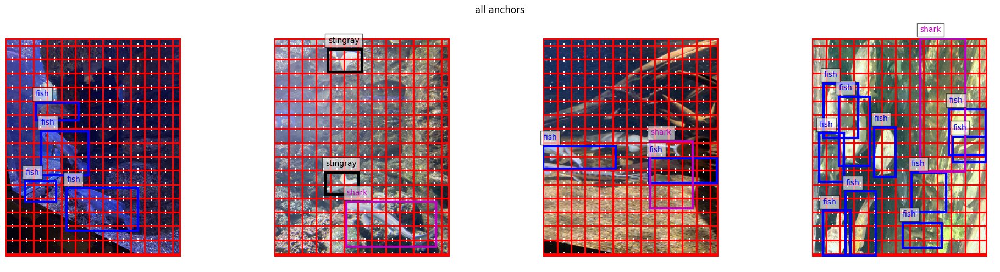

In [39]:
visualize_dataloader(train_loader, x_points, y_points, nrows=1, ncol=4, num = 4, fig_size=(20, 5), title='all anchors')

# **MODEL**

In [17]:
resnet = models.resnet101()
model_path = '/kaggle/input/resnet101/resnet101.pth'
resnet.load_state_dict(torch.load(model_path))
# resnet.eval()

<All keys matched successfully>

In [18]:
class FeatureExtractor(nn.Module):
    def __init__(self, original_model):
        super(FeatureExtractor, self).__init__()
        self.features = nn.Sequential(*list(original_model.children())[:-2])
        self.out_channels = 2048  # ResNet101 outputs 2048 channels from the last convolutional layer

    def forward(self, x):
        x = self.features(x)
        return x

In [17]:
images, gt_bboxes, gt_cls = next(iter(train_loader)) 

In [18]:
backbone = FeatureExtractor(resnet)
feature_maps = backbone(images)
feature_maps.shape

torch.Size([16, 2048, 16, 13])

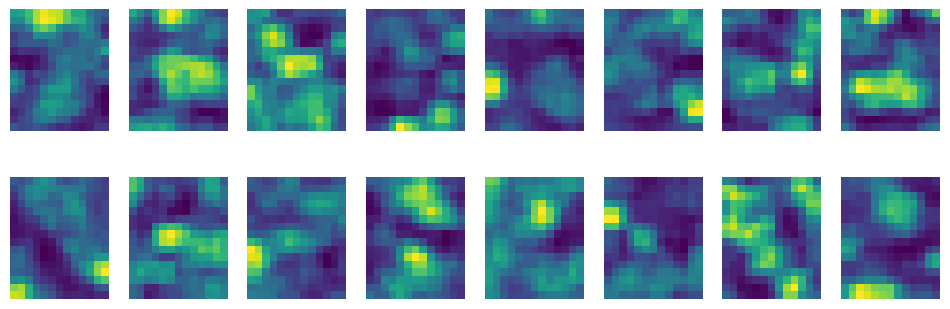

In [19]:
plt.figure(figsize=(12,4))

for i in range(16):
    plt.subplot(2, 8, i+1)
    average_map = torch.mean(feature_maps[i], dim=0) # Average on 2048 channels
    img = average_map.detach().numpy()
    plt.imshow(img)
    plt.axis('off')
    
plt.show()

In [19]:
def calc_cls_loss(conf_scores_pos, conf_scores_neg, batch_size):
    target_pos = torch.ones_like(conf_scores_pos)
    target_neg = torch.zeros_like(conf_scores_neg)
    
    target = torch.cat((target_pos, target_neg))
    inputs = torch.cat((conf_scores_pos, conf_scores_neg))
    loss = F.binary_cross_entropy_with_logits(inputs, target, reduction='sum') * 1. / batch_size
    return loss

def calc_bbox_reg_loss(gt_offsets, reg_offsets_pos, batch_size):
    # Ensure gt_offsets and reg_offsets_pos are on the same device
    device = gt_offsets.device
    reg_offsets_pos = reg_offsets_pos.to(device)
    
    assert gt_offsets.size() == reg_offsets_pos.size()
    loss = F.smooth_l1_loss(reg_offsets_pos, gt_offsets, reduction='sum') * 1. / batch_size
    return loss

In [20]:
def generate_proposals(anchors, offsets):
    # Ensure anchors and offsets are on the same device
    device = anchors.device
    offsets = offsets.to(device)

    # Change format of the anchor boxes from 'xyxy' to 'cxcywh'
    anchors = ops.box_convert(anchors, in_fmt='xyxy', out_fmt='cxcywh')

    # Apply offsets to anchors to create proposals
    proposals_ = torch.zeros_like(anchors)
    proposals_[:, 0] = anchors[:, 0] + offsets[:, 0] * anchors[:, 2]
    proposals_[:, 1] = anchors[:, 1] + offsets[:, 1] * anchors[:, 3]
    proposals_[:, 2] = anchors[:, 2] * torch.exp(offsets[:, 2])
    proposals_[:, 3] = anchors[:, 3] * torch.exp(offsets[:, 3])

    # Change format of proposals back from 'cxcywh' to 'xyxy'
    proposals = ops.box_convert(proposals_, in_fmt='cxcywh', out_fmt='xyxy')

    return proposals

In [21]:
class FeatureExtractor(nn.Module):
    def __init__(self, original_model):
        super(FeatureExtractor, self).__init__()
        self.features = nn.Sequential(*list(original_model.children())[:-2])
        self.out_channels = 2048  # ResNet101 outputs 2048 channels from the last convolutional layer

    def forward(self, x):
        x = self.features(x)
        return x

In [22]:
class ProposalModule(nn.Module):
    def __init__(self, in_features, hidden_dim=512, n_anchors=9, p_dropout=0.3):
        super().__init__()
        self.n_anchors = n_anchors
        self.conv1 = nn.Conv2d(in_features, hidden_dim, kernel_size=3, padding=1)
        self.dropout = nn.Dropout(p_dropout)
        self.conf_head = nn.Conv2d(hidden_dim, n_anchors, kernel_size=1)
        self.reg_head = nn.Conv2d(hidden_dim, n_anchors * 4, kernel_size=1)
        
    def forward(self, feature_map, pos_anc_ind=None, neg_anc_ind=None, pos_anc_coords=None):
        # Determine mode
        if pos_anc_ind is None or neg_anc_ind is None or pos_anc_coords is None:
            mode = 'eval'
        else:
            mode = 'train'
            
        out = self.conv1(feature_map)
        out = F.relu(self.dropout(out))
        
        reg_offsets_pred = self.reg_head(out) # (B, A*4, hmap, wmap)
        conf_scores_pred = self.conf_head(out) # (B, A, hmap, wmap)
        
        if mode == 'train': 
            # Get conf scores
            conf_scores_pos = conf_scores_pred.flatten()[pos_anc_ind]
            conf_scores_neg = conf_scores_pred.flatten()[neg_anc_ind]
            # Get offsets for +ve anchors
            offsets_pos = reg_offsets_pred.contiguous().view(-1, 4)[pos_anc_ind]
            # Ensure pos_anc_coords is on the same device as offsets_pos
            pos_anc_coords = pos_anc_coords.to(offsets_pos.device)
            # Generate proposals using offsets
            proposals = generate_proposals(pos_anc_coords, offsets_pos)
            
            return conf_scores_pos, conf_scores_neg, offsets_pos, proposals
            
        elif mode == 'eval':
            return conf_scores_pred, reg_offsets_pred

In [23]:
class RegionProposalNetwork(nn.Module):
    def __init__(self, img_size, out_size, out_channels):
        super().__init__()
        
        self.img_height, self.img_width = img_size
        self.out_h, self.out_w = out_size
        
        # downsampling scale factor 
        self.width_scale_factor = self.img_width // self.out_w
        self.height_scale_factor = self.img_height // self.out_h 
        
        # scales and ratios for anchor boxes
        self.anc_scales = [4, 8, 16]
        self.anc_ratios = [0.5, 1, 2]
        self.n_anc_boxes = len(self.anc_scales) * len(self.anc_ratios)
        
        # IoU thresholds for +ve and -ve anchors
        self.pos_thresh = 0.7
        self.neg_thresh = 0.3
        
        # weights for loss
        self.w_conf = 1
        self.w_reg = 5
        
        self.feature_extractor = FeatureExtractor(resnet)
        self.proposal_module = ProposalModule(out_channels, n_anchors=self.n_anc_boxes)
        
    def forward(self, images, gt_bboxes, gt_classes):
        batch_size = images.size(dim=0)
        feature_map = self.feature_extractor(images)
        
        # generate anchors
        anc_pts_x, anc_pts_y = gen_anc_centers(out_size=(self.out_h, self.out_w))
        anc_base = gen_anc_base(anc_pts_x, anc_pts_y, self.anc_scales, self.anc_ratios, (self.out_h, self.out_w))
        anc_boxes_all = anc_base.repeat(batch_size, 1, 1, 1, 1)
        
        # get positive and negative anchors amongst other things
        gt_bboxes_proj = project_bboxes(gt_bboxes, self.width_scale_factor, self.height_scale_factor, mode='p2a')
        
        positive_anc_ind, negative_anc_ind, GT_conf_scores, \
        GT_offsets, GT_class_pos, positive_anc_coords, \
        negative_anc_coords, positive_anc_ind_sep = get_req_anchors(anc_boxes_all, gt_bboxes_proj, gt_classes)
        
        # pass through the proposal module
        conf_scores_pos, conf_scores_neg, offsets_pos, proposals = self.proposal_module(feature_map, positive_anc_ind, \
                                                                                        negative_anc_ind, positive_anc_coords)
        
        cls_loss = calc_cls_loss(conf_scores_pos, conf_scores_neg, batch_size)
        reg_loss = calc_bbox_reg_loss(GT_offsets, offsets_pos, batch_size)
        
        total_rpn_loss = self.w_conf * cls_loss + self.w_reg * reg_loss
        
        return total_rpn_loss, feature_map, proposals, positive_anc_ind_sep, GT_class_pos
    
    def inference(self, images, conf_thresh=0.5, nms_thresh=0.7):
        with torch.no_grad():
            batch_size = images.size(dim=0)
            feature_map = self.feature_extractor(images)

            # generate anchors
            anc_pts_x, anc_pts_y = gen_anc_centers(out_size=(self.out_h, self.out_w))
            anc_base = gen_anc_base(anc_pts_x, anc_pts_y, self.anc_scales, self.anc_ratios, (self.out_h, self.out_w))
            anc_boxes_all = anc_base.repeat(batch_size, 1, 1, 1, 1)
            anc_boxes_flat = anc_boxes_all.reshape(batch_size, -1, 4)

            # get conf scores and offsets
            conf_scores_pred, offsets_pred = self.proposal_module(feature_map)
            conf_scores_pred, offsets_pred = conf_scores_pred.to(device), offsets_pred.to(device)
            conf_scores_pred = conf_scores_pred.reshape(batch_size, -1)
            offsets_pred = offsets_pred.reshape(batch_size, -1, 4)

            # filter out proposals based on conf threshold and nms threshold for each image
            proposals_final = []
            conf_scores_final = []
            for i in range(batch_size):
                conf_scores = torch.sigmoid(conf_scores_pred[i])
                offsets = offsets_pred[i]
                anc_boxes = anc_boxes_flat[i]
                proposals = generate_proposals(anc_boxes, offsets).to(device)
                # filter based on confidence threshold
                conf_idx = torch.where(conf_scores >= conf_thresh)[0]
                conf_scores_pos = conf_scores[conf_idx]
                proposals_pos = proposals[conf_idx]
                # filter based on nms threshold
                nms_idx = ops.nms(proposals_pos, conf_scores_pos, nms_thresh).to(device)
                conf_scores_pos = conf_scores_pos[nms_idx]
                proposals_pos = proposals_pos[nms_idx]

                proposals_final.append(proposals_pos)
                conf_scores_final.append(conf_scores_pos)
            
        return proposals_final, conf_scores_final, feature_map

In [24]:
class ClassificationModule(nn.Module):
    def __init__(self, out_channels, n_classes, roi_size, hidden_dim=512, p_dropout=0.3):
        super().__init__()
        self.roi_size = roi_size
        self.avg_pool = nn.AvgPool2d(self.roi_size)
        self.fc = nn.Linear(out_channels, hidden_dim)
        self.dropout = nn.Dropout(p_dropout)
        self.cls_head = nn.Linear(hidden_dim, n_classes)
        
    def forward(self, feature_map, proposals_list, gt_classes=None):
        if gt_classes is None:
            mode = 'eval'
        else:
            mode = 'train'


        roi_out = ops.roi_pool(feature_map, proposals_list, self.roi_size)
        roi_out = self.avg_pool(roi_out)
        roi_out = roi_out.squeeze(-1).squeeze(-1)
        
        out = self.fc(roi_out)
        out = F.relu(self.dropout(out))
        
        cls_scores = self.cls_head(out)
        
        if mode == 'eval':
            return cls_scores
        
        device = cls_scores.device
        gt_classes = gt_classes.to(device)

        aligned_gt_classes = []
        start_idx = 0
        for proposals in proposals_list:
            num_proposals = proposals.size(0)
            aligned_gt_classes.append(gt_classes[start_idx:start_idx + num_proposals])
            start_idx += num_proposals
        
        aligned_gt_classes = torch.cat(aligned_gt_classes)
        
        cls_loss = F.cross_entropy(cls_scores, aligned_gt_classes.long())
        
        return cls_loss

In [25]:
class TwoStageDetector(nn.Module):
    def __init__(self, img_size, out_size, out_channels, n_classes, roi_size):
        super().__init__()
        self.rpn = RegionProposalNetwork(img_size, out_size, out_channels)
        self.classifier = ClassificationModule(out_channels, n_classes, roi_size)
        
    def forward(self, images, gt_bboxes, gt_classes):
        device = images.device

        total_rpn_loss, feature_map, proposals, positive_anc_ind_sep, GT_class_pos = self.rpn(images, gt_bboxes, gt_classes)

        pos_proposals_list = []
        for i in range(len(images)):
            proposal_idxs = positive_anc_ind_sep[i]
            proposals_sep = proposals[proposal_idxs].detach().clone()
            # Ensure proposals_sep is 2D
            if proposals_sep.dim() == 1:
                proposals_sep = proposals_sep.unsqueeze(0)
            # Add batch index to proposals
            batch_indices = torch.full((proposals_sep.shape[0], 1), i, dtype=torch.float32, device=device)
            proposals_with_indices = torch.cat([batch_indices, proposals_sep], dim=1)
            pos_proposals_list.append(proposals_with_indices)
        
        # Debugging statements

        # Ensure GT_class_pos is on the same device as feature_map
        GT_class_pos = GT_class_pos.to(device)
        
        # Remove batch index before passing to classifier
        proposals_list = [proposal[:, 1:] for proposal in pos_proposals_list]

        cls_loss = self.classifier(feature_map, proposals_list, GT_class_pos)
        total_loss = cls_loss + total_rpn_loss

        return total_loss
    
    
    def inference(self, images, conf_thresh=0.5, nms_thresh=0.7):
        batch_size = images.size(dim=0)
        proposals_final, conf_scores_final, feature_map = self.rpn.inference(images, conf_thresh, nms_thresh)
        cls_scores = self.classifier(feature_map, proposals_final)
        
        # convert scores into probability
        cls_probs = F.softmax(cls_scores, dim=-1)
        # get classes with highest probability
        classes_all = torch.argmax(cls_probs, dim=-1)
        
        classes_final = []
        # slice classes to map to their corresponding image
        c = 0
        for i in range(batch_size):
            n_proposals = len(proposals_final[i]) # get the number of proposals for each image
            classes_final.append(classes_all[c: c+n_proposals])
            c += n_proposals
            
        return proposals_final, conf_scores_final, classes_final

In [26]:
def train(model, train_loader, optimizer, device):
    model.train()
    train_loss = 0.0
    for img_batch, gt_bboxes_batch, gt_classes_batch in tqdm(train_loader, desc="Training", leave=False):
        gt_bboxes_batch = gt_bboxes_batch[:, :, :4]
        img_batch, gt_bboxes_batch, gt_classes_batch = img_batch.to(device), gt_bboxes_batch.to(device), gt_classes_batch.to(device)
        optimizer.zero_grad()
        loss = model(img_batch, gt_bboxes_batch, gt_classes_batch)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    return train_loss / len(train_loader.dataset)

def validate(model, val_loader, device):
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for img_batch, gt_bboxes_batch, gt_classes_batch in tqdm(val_loader, desc="Validating", leave=False):
            gt_bboxes_batch = gt_bboxes_batch[:, :, :4]
            img_batch, gt_bboxes_batch, gt_classes_batch = img_batch.to(device), gt_bboxes_batch.to(device), gt_classes_batch.to(device)
            loss = model(img_batch, gt_bboxes_batch, gt_classes_batch)
            val_loss += loss.item()
    return val_loss / len(val_loader.dataset)


In [27]:
def train_loop(model, configs):
    train_losses = []
    val_losses = []
    optimizer, scheduler = configs['optimizer'], configs['scheduler']
    best_loss = np.inf
    best_model = None
    for epoch in range(configs['epochs']):
        print(f"Epoch [{epoch+1}/{configs['epochs']}]")
        train_loss = train(model, configs['train_loader'], optimizer, configs['device'])
        val_loss = validate(model, configs['val_loader'], configs['device'])
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        scheduler.step()
        print(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Learning Rate: {optimizer.state_dict()['param_groups'][0]['lr']}")
        if val_loss < best_loss:
            print('Saving the best model on validation data')
            best_loss = val_loss
            best_model = model.state_dict()
    history = {'train_loss': train_losses, 'val_loss': val_losses}
    model.load_state_dict(best_model)
    return model, history

In [28]:
train_loader = DataLoader(train_dataset, batch_size=20, shuffle=True, num_workers = 3, collate_fn= collatefn)
valid_loader = DataLoader(valid_dataset, batch_size=20, shuffle=False, num_workers = 3, collate_fn=collatefn)

In [29]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
img_size = (500, 400)
out_size = (16, 13)
n_classes = 8
roi_size = (2, 2)
out_channels = 2048

detector = TwoStageDetector(img_size, out_size, out_channels, n_classes, roi_size)
learning_rate = 0.01
detector = detector.to(device)
optimizer = optim.Adam(detector.parameters(), lr=learning_rate)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

configs = {'train_loader':train_loader,
           'val_loader':valid_loader,
           'device': device,
           'optimizer':optimizer, 'scheduler':scheduler, 'epochs':20}


best_model , history = train_loop(detector, configs)

Epoch [1/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 68.0785, Val Loss: 321182.7549, Learning Rate: 0.01
Saving the best model on validation data
Epoch [2/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.3901, Val Loss: 8.2432, Learning Rate: 0.01
Saving the best model on validation data
Epoch [3/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.0960, Val Loss: 5.2833, Learning Rate: 0.01
Saving the best model on validation data
Epoch [4/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.2439, Val Loss: 5.1382, Learning Rate: 0.01
Saving the best model on validation data
Epoch [5/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.1637, Val Loss: 5.1086, Learning Rate: 0.001
Saving the best model on validation data
Epoch [6/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 5.9913, Val Loss: 5.1106, Learning Rate: 0.001
Epoch [7/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.1058, Val Loss: 5.1008, Learning Rate: 0.001
Saving the best model on validation data
Epoch [8/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.0275, Val Loss: 5.1032, Learning Rate: 0.001
Epoch [9/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.0000, Val Loss: 5.0875, Learning Rate: 0.001
Saving the best model on validation data
Epoch [10/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 5.9593, Val Loss: 5.0712, Learning Rate: 0.0001
Saving the best model on validation data
Epoch [11/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.1018, Val Loss: 5.0666, Learning Rate: 0.0001
Saving the best model on validation data
Epoch [12/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.0405, Val Loss: 5.0619, Learning Rate: 0.0001
Saving the best model on validation data
Epoch [13/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 5.9330, Val Loss: 5.0679, Learning Rate: 0.0001
Epoch [14/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 5.9972, Val Loss: 5.0844, Learning Rate: 0.0001
Epoch [15/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.2061, Val Loss: 5.0612, Learning Rate: 1e-05
Saving the best model on validation data
Epoch [16/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.0487, Val Loss: 5.0695, Learning Rate: 1e-05
Epoch [17/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 5.9179, Val Loss: 5.0712, Learning Rate: 1e-05
Epoch [18/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.0803, Val Loss: 5.0719, Learning Rate: 1e-05
Epoch [19/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 5.9538, Val Loss: 5.0810, Learning Rate: 1e-05
Epoch [20/20]


Training:   0%|          | 0/23 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 6.0394, Val Loss: 5.0662, Learning Rate: 1.0000000000000002e-06


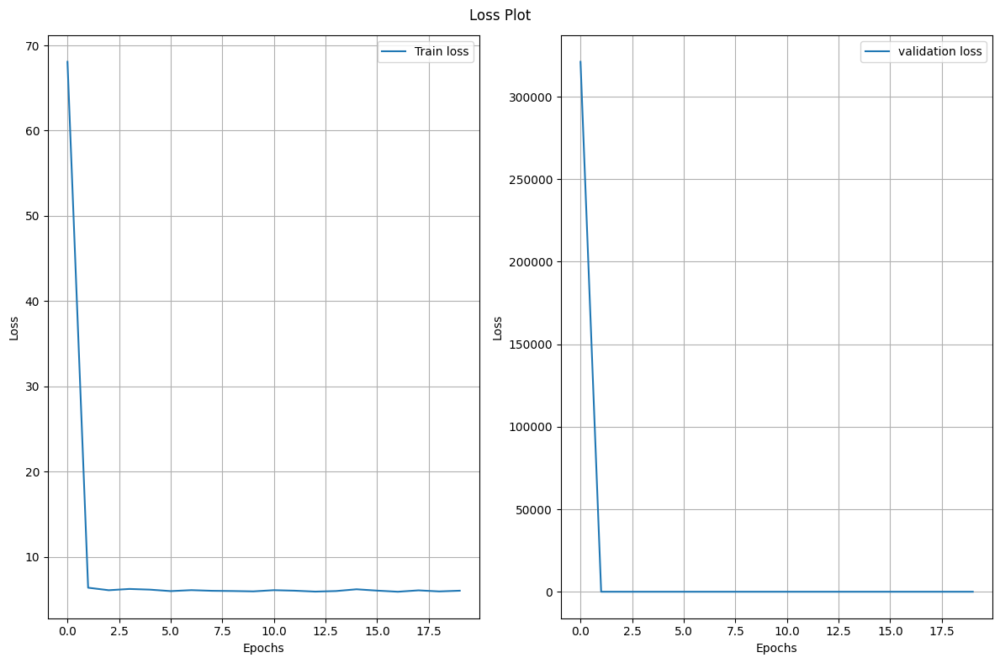

In [33]:
plt.figure(figsize=(8,6))
plt.suptitle('Loss Plot')

plt.subplot(1,2,1)
plt.plot(history['train_loss'], label='Train loss')
plt.grid()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history['val_loss'], label='validation loss')
plt.grid()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()


plt.tight_layout()
plt.show()

In [54]:
def inference(model, data_loader, nrows=1, ncol=2, num =2, fig_size=(10, 5), title=''):
    
    assert nrows * ncol == num, 'MUST be : nrows*ncol == num'
    classcolor = ['', 'b', 'g', 'r', 'c', 'm', 'y', 'k']
    classes = ['background', 'fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
    
    for image, _, _ in data_loader:
        break  
    image = image.to(device)
    proposals_final, conf_scores_final, classes_final = model.inference(image)
    
    
    fig, ax = plt.subplots(nrows, ncol, figsize=fig_size)
    ax = ax.ravel() 

    for i in range(num):
        img = image[i].permute(1,2,0).detach().cpu()
        img = (img * 0.5) + 0.5
        height, width, _ = img.shape
        
        ax[i].imshow(img)
        ax[i].axis('off')
        
        valid_row_indices = (proposals_final[i] != -1).any(dim=1).nonzero(as_tuple=False).squeeze()
        valid_values = proposals_final[i][valid_row_indices] * 32
                
        if len(valid_values.shape) == 1:
            valid_values = valid_values.unsqueeze(0)
        
        for value, label in zip(valid_values[::100], classes_final[i][::100]):
            
            x1, y1, x2, y2 = value.detach().cpu()
            label = int(label)
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=3,
                                     edgecolor='red', facecolor='none')
            ax[i].add_patch(rect)
            
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

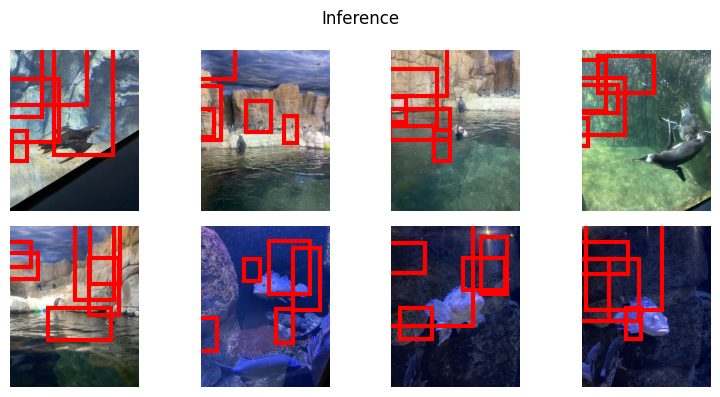

In [55]:
test_loader = DataLoader(test_dataset, batch_size= 16, shuffle=False, collate_fn=collatefn)
inference(detector, test_loader, nrows=2, ncol=4, num =8, fig_size=(8, 4), title='Inference')